## Embedding of IPF cells

This notebook subsets all data to IPF related datasets, and the core, to explore the cell types, their label transfer uncertainty, and their association/changes with disease. We take the scArches-based embedding and explore uncertainty of label transfer at level 4.

#### Structure

* [Global variables and paths](#bullet1)
* [Loading data](#bullet2)
* [Pre-processing](#bullet3)
* [Main](#bullet4)
* [Conclusions](#bullet5)
* [Save](#bullet6)

### Environment setup

In [1]:
%load_ext autoreload
%autoreload 2
import importlib

spam_spec = importlib.util.find_spec("lab_black")
if spam_spec is not None:
    %load_ext lab_black

In [2]:
# basic modules
import os, re, time
import sys, warnings

warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=UserWarning)

In [3]:
# in-house/developing modules
# tools modules
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

sc.logging.print_versions()

-----
anndata     0.8.0
scanpy      1.9.1
-----
7b32b9a39ad70713acde__mypyc NA
PIL                         9.2.0
autoreload                  NA
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
black                       22.6.0
blib2to3                    NA
cffi                        1.15.1
click                       8.1.3
cycler                      0.10.0
cython_runtime              NA
dateutil                    2.8.2
debugpy                     1.6.2
decorator                   5.1.1
defusedxml                  0.7.1
entrypoints                 0.4
h5py                        3.7.0
igraph                      0.9.11
ipykernel                   6.15.1
ipython_genutils            0.2.0
jedi                        0.18.1
joblib                      1.1.0
jupyter_server              1.18.1
kiwisolver                  1.4.4
lab_black                   NA
leidenalg                   0.8.10
llvmlite                    0.39.0
matplotlib    

In [5]:
# setting visualisation parameters
sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=200)
sc.set_figure_params(figsize=(7, 7))

### Global variables and paths

We need the scArches embedding and the transfered labels. We will output an object with the UMAP calculated from the IPF subset.

In [6]:
embed_inp = "../../data/HLCA_extended/HLCA_extended/HLCA_extended_scarches_emb.h5ad"
embed_out = (
    "../../data/HLCA_extended/extension_disease/scarches_emb_ipf_all-celltypes.h5ad"
)
annot_inp = "../../results/HLCA_ext_label_transfer/transfered_labels_query_only.csv"
celltypes_labels = "transf_ann_level_5"

In [77]:
sc.settings.figdir = "../../results/figures/"
sc.settings.figdir

PosixPath('../../results/figures')

### Loading data <a class="anchor" id="bullet2"></a>

In [21]:
embed = sc.read(embed_inp)

In [22]:
embed

AnnData object with n_obs × n_vars = 2382658 × 30
    obs: 'sample', 'original_celltype_ann', 'study_long', 'study', 'last_author_PI', 'subject_ID', 'subject_ID_as_published', 'pre_or_postnatal', 'age_in_years', 'age_range', 'sex', 'smoking_status', 'smoking_history', 'BMI', 'known_lung_disease', 'condition', 'subject_type', 'cause_of_death', 'sample_type', 'anatomical_region_coarse', 'anatomical_region_detailed', 'tissue_dissociation_protocol', 'cells_or_nuclei', 'single_cell_platform', "3'_or_5'", 'enrichment', 'sequencing_platform', 'reference_genome_coarse', 'ensembl_release_reference_genome', 'cell_ranger_version', 'disease_status', 'fresh_or_frozen', 'cultured', 'cell_viability_%', 'comments', 'Processing_site', 'dataset', 'anatomical_region_level_1', 'anatomical_region_level_2', 'anatomical_region_level_3', 'anatomical_region_highest_res', 'age', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'ann_highest_res', 'ann_new', 'n_genes', 'total_counts', 'l

Let's check the diseases. We will subset to IPF later in this notebook.

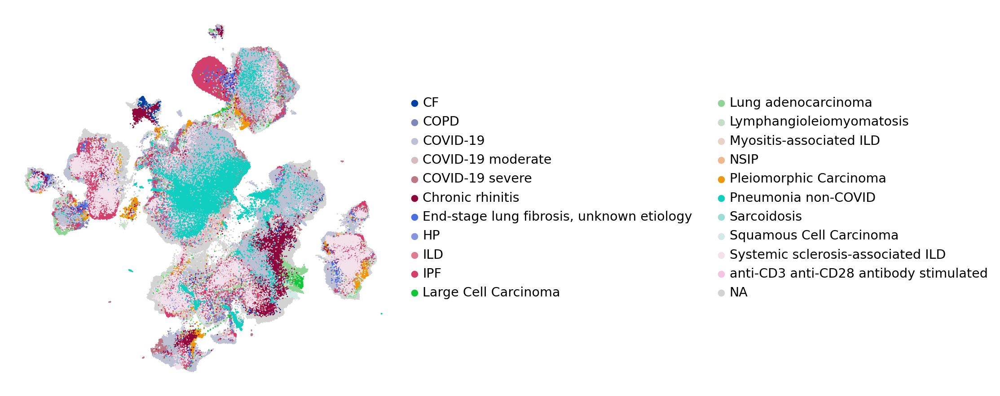

In [10]:
temp = list(
    set(embed.obs.condition.cat.categories)
    - set(["Healthy (tumor adjacent)", "Healthy"])
)
sc.pl.umap(
    embed, color="condition", groups=temp, size=7, frameon=False, wspace=0.6, title=""
)

In [23]:
del embed.uns
del embed.obsm
del embed.obsp

Now we load the transfered labels.

In [24]:
annot_pred = pd.read_csv(annot_inp, index_col=0)

In [25]:
annot_pred.head(5)

,most_confident_level,most_confident_uncert,most_confident_label,transf_ann_level_5_uncert,transf_ann_level_5_label,transf_ann_level_4_uncert,transf_ann_level_4_label,transf_ann_level_3_uncert,transf_ann_level_3_label,transf_ann_level_2_uncert,transf_ann_level_2_label,transf_ann_level_1_uncert,transf_ann_level_1_label
001C_AAACCTGCATCGGGTC_adams,Level_3,0.000000e+00,Monocytes,1.400267e-01,4_Non-classical monocytes,1.400267e-01,Non-classical monocytes,0.000000e+00,Monocytes,0.000000e+00,Myeloid,0.000000e+00,Immune
001C_AAACCTGTCAACACCA_adams,Level_4,0.000000e+00,Alveolar macrophages,2.600470e-01,4_Alveolar macrophages,0.000000e+00,Alveolar macrophages,0.000000e+00,Macrophages,0.000000e+00,Myeloid,0.000000e+00,Immune
001C_AAACCTGTCACAGTAC_adams,Level_2,5.960464e-08,Lymphoid,2.200202e-01,4_NK cells,2.200202e-01,NK cells,2.200202e-01,Innate lymphoid cell NK,5.960464e-08,Lymphoid,5.960464e-08,Immune
001C_AAACCTGTCTGTCTAT_adams,Level_2,0.000000e+00,Myeloid,2.799665e-01,Monocyte-derived Mph,2.599604e-01,Interstitial macrophages,2.399455e-01,Macrophages,0.000000e+00,Myeloid,0.000000e+00,Immune
001C_AAACGGGAGACTAAGT_adams,Level_5,5.960464e-08,3_Lymphatic EC mature,5.960464e-08,3_Lymphatic EC mature,5.960464e-08,3_Lymphatic EC mature,5.960464e-08,Lymphatic EC mature,5.960464e-08,Lymphatic EC,5.960464e-08,Endothelial


### Pre-processing <a class="anchor" id="bullet3"></a>

#### Sorting missing/messy labels

Checking if the cells from the extension datasets can all be found in the transferred labels table:

In [26]:
index_intersect = list(set(embed.obs.index) & set(annot_pred.index))
print("Intersection with prediction:", len(index_intersect))
embed.obs.core_or_extension.value_counts()

Intersection with prediction: 1797714


extension    1797714
core          584944
Name: core_or_extension, dtype: int64

We now have two separate cell type columns: for the core, we have the manual annotations in `ann_level_[1-5]`. For the extension, we have the transferred annotations in `transf_ann_level_[1-5]_label`. To be able to analyze core and extension together, we will add the core annotations into the `transf_ann_level_[1-5]_label` columns below.  

In [29]:
for column_i in list(
    filter(re.compile(r"transf_ann_level_._label").search, embed.obs.columns)
):
    print("--------------------", column_i)
    embed.obs[column_i] = embed.obs[column_i].astype(str)
    embed.obs[re.sub("transf_|_label", "", column_i)] = embed.obs[
        re.sub("transf_|_label", "", column_i)
    ].astype(str)
    temp = embed.obs[column_i] == "nan" # check which cells have nan in column (these should be the core cells)
    embed.obs["celltype"] = embed.obs[column_i] # create temporary column to store both core and ext anns in
    embed.obs.loc[temp, "celltype"] = embed.obs.loc[
        temp, re.sub("transf_|_label", "", column_i)
    ] # extract core annotations (from ann_level_|) from cells in temp, add to cell type column
    embed.obs[column_i] = embed.obs["celltype"] # store temp cell type column as transf_ann_level_._label column

-------------------- transf_ann_level_1_label
-------------------- transf_ann_level_2_label
-------------------- transf_ann_level_3_label
-------------------- transf_ann_level_4_label
-------------------- transf_ann_level_5_label


check result:

In [34]:
embed.obs[
    [column_i, re.sub("transf_|_label", "", column_i), "celltype", "core_or_extension"]
]

,transf_ann_level_5_label,ann_level_5,celltype,core_or_extension
GCGACCATCCCTAACC_SC22,4_Alveolar macrophages,4_Alveolar macrophages,4_Alveolar macrophages,core
P2_1_GCGCAACCAGTTAACC,4_NK cells,4_NK cells,4_NK cells,core
GCTCTGTAGTGCTGCC_SC27,3_AT2,3_AT2,3_AT2,core
P2_8_TTAGGACGTTCAGGCC,Alveolar Mph CCL3+,Alveolar Mph CCL3+,Alveolar Mph CCL3+,core
CTTGATTGTCAGTTTG_T164,4_Suprabasal,4_Suprabasal,4_Suprabasal,core
...,...,...,...,...
TTTGATCTCGGAATTC-1_DD073R_tata_unpubl,4_Alveolar fibroblasts,nan,4_Alveolar fibroblasts,extension
TTTGGAGAGGATTTAG-1_DD073R_tata_unpubl,3_Smooth muscle FAM83D+,nan,3_Smooth muscle FAM83D+,extension
TTTGGTTCACGACGCT-1_DD073R_tata_unpubl,4_Peribronchial fibroblasts,nan,4_Peribronchial fibroblasts,extension
TTTGGTTGTGATACAA-1_DD073R_tata_unpubl,4_Alveolar fibroblasts,nan,4_Alveolar fibroblasts,extension


We will only be taking the subjects from IPF datasets (diseased and healthy) along with the [healthy] core.

First, we'll clean up the condition columns a little bit more:

In [35]:
condition_renamer = {i: i for i in embed.obs.condition.cat.categories}
condition_renamer["End-stage lung fibrosis, unknown etiology"] = "IPF"  #
condition_renamer["Healthy (tumor adjacent)"] = "Healthy"
embed.obs["condition"] = embed.obs.condition.map(condition_renamer)

There are two samples (one subject) in the Schiller_2020 data that are End-stage Fibrosis but not IPF.

In [36]:
schiller_subjects = (
    embed.obs.loc[embed.obs.study == "Schiller_2020"]
    .subject_ID.astype(str)
    .unique()
    .tolist()
)
schiller_subjects = set(schiller_subjects) - set(["muc8257", "muc8258"])

Barbry_unpubl is discarded because of the poor gene overlap with the core, which resulted in a low-quality embedding.

In [37]:
embed_ext_obs = embed.obs.loc[embed.obs.core_or_extension == "extension", :]
df = pd.crosstab(embed_ext_obs.study, embed_ext_obs.condition)
dsets = list(
    set(df.loc[df.IPF > 0].index.tolist()) - set(["Barbry_unpubl", "Schiller_2020"])
)
dsets.append("Schiller_2020")
dsets

['Banovich_Kropski_2020',
 'Kaminski_2020',
 'Misharin_Budinger_2018',
 'Sheppard_2020',
 'Schiller_2020']

Schiller is at the end of the list in this case and so it's used to discard the two samples that are not IPF.

Also including the core.

In [40]:
embed_disease_obs = embed.obs[
    embed.obs.study.isin(dsets[:-1]) & embed.obs.condition.isin(["Healthy", "IPF"])
    | (embed.obs.study.isin(dsets[-1:]) & embed.obs.subject_ID.isin(schiller_subjects))
    | (embed.obs["core_or_extension"] == "core")
].copy()

In [41]:
pd.crosstab(embed_disease_obs.study, embed_disease_obs.condition)

condition,Healthy,IPF
study,,
Banovich_Kropski_2020,121894,57668
Barbry_Leroy_2020,74487,0
Jain_Misharin_2021,45557,0
Kaminski_2020,95303,144404
Krasnow_2020,60982,0
Lafyatis_Rojas_2019,24181,0
Meyer_2019,35554,0
Misharin_2021,64843,0
Misharin_Budinger_2018,41220,15517


We are taking all celltypes this time.

In [43]:
embed_disease = embed[embed_disease_obs.index].copy()

In [44]:
embed_disease

AnnData object with n_obs × n_vars = 988961 × 30
    obs: 'sample', 'original_celltype_ann', 'study_long', 'study', 'last_author_PI', 'subject_ID', 'subject_ID_as_published', 'pre_or_postnatal', 'age_in_years', 'age_range', 'sex', 'smoking_status', 'smoking_history', 'BMI', 'known_lung_disease', 'condition', 'subject_type', 'cause_of_death', 'sample_type', 'anatomical_region_coarse', 'anatomical_region_detailed', 'tissue_dissociation_protocol', 'cells_or_nuclei', 'single_cell_platform', "3'_or_5'", 'enrichment', 'sequencing_platform', 'reference_genome_coarse', 'ensembl_release_reference_genome', 'cell_ranger_version', 'disease_status', 'fresh_or_frozen', 'cultured', 'cell_viability_%', 'comments', 'Processing_site', 'dataset', 'anatomical_region_level_1', 'anatomical_region_level_2', 'anatomical_region_level_3', 'anatomical_region_highest_res', 'age', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'ann_highest_res', 'ann_new', 'n_genes', 'total_counts', 'lo

Checking if all celltypes are well represented.

In [45]:
temp = embed_disease.obs.transf_ann_level_4_label.value_counts()
pd.set_option("display.max_rows", len(temp))
temp

Alveolar macrophages              165911
Interstitial macrophages          111090
3_AT2                              78785
Multiciliated                      63511
CD8 T cells                        48377
Classical monocytes                45153
Suprabasal                         43231
Basal resting                      41196
Goblet                             40155
Club                               37035
CD4 T cells                        34009
NK cells                           26128
DC2                                25955
Alveolar fibroblasts               21580
EC general capillary               20258
Adventitial fibroblasts            18950
Non-classical monocytes            17300
2_Smooth muscle                    16815
B cells                            12693
EC venous systemic                 12267
Transitional Club-AT2              12043
3_AT1                              10357
3_Mast cells                       10079
3_EC arterial                       9112
EC aerocyte capi

### Main <a class="anchor" id="bullet4"></a>

Calculate UMAP. Note that this takes quite long and is not needed for generating the paper figure, so skip if wanted.

We calculate the nearest neighbors graph for our new UMAP and clustering of IPF datasets.

In [46]:
%%time
sc.pp.neighbors(embed_disease, n_neighbors=30)

/home/icb/lisa.sikkema/miniconda3/envs/HLCA_basic/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


CPU times: user 7min 21s, sys: 5.7 s, total: 7min 26s
Wall time: 5min 16s


In [47]:
%%time
sc.tl.umap(embed_disease)

CPU times: user 1h 8min 41s, sys: 1min 24s, total: 1h 10min 6s
Wall time: 47min 27s


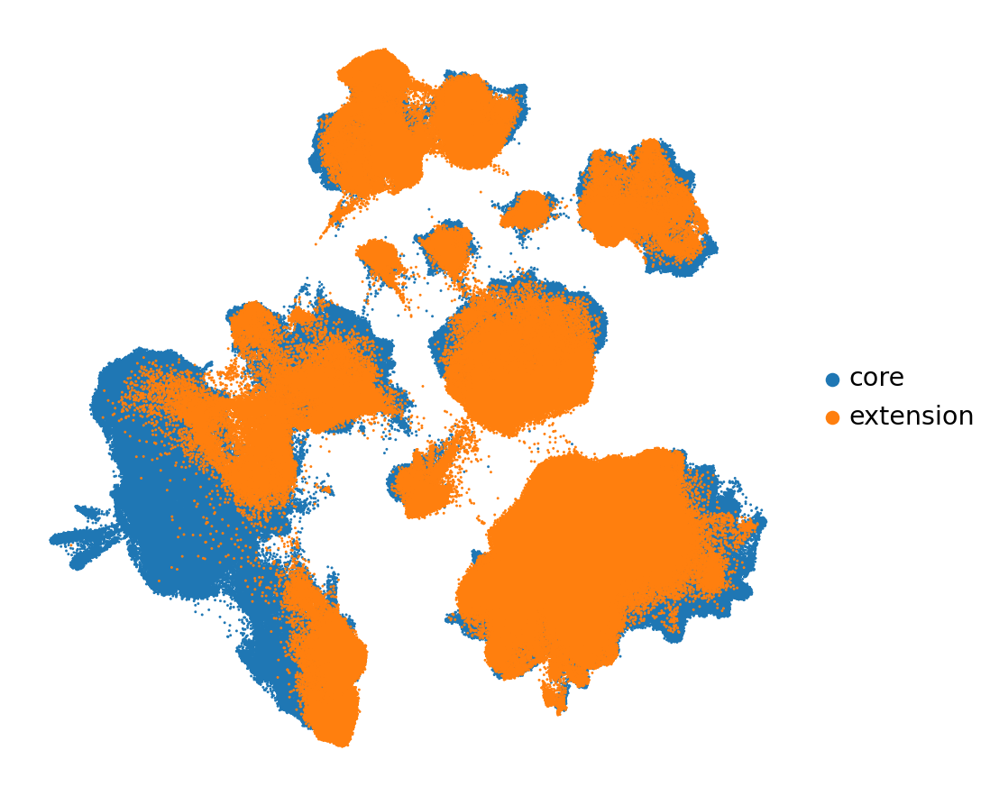

In [48]:
sc.pl.umap(
    embed_disease,
    color="core_or_extension",
    frameon=False,
    size=7,
    wspace=0.6,
    title="",
)

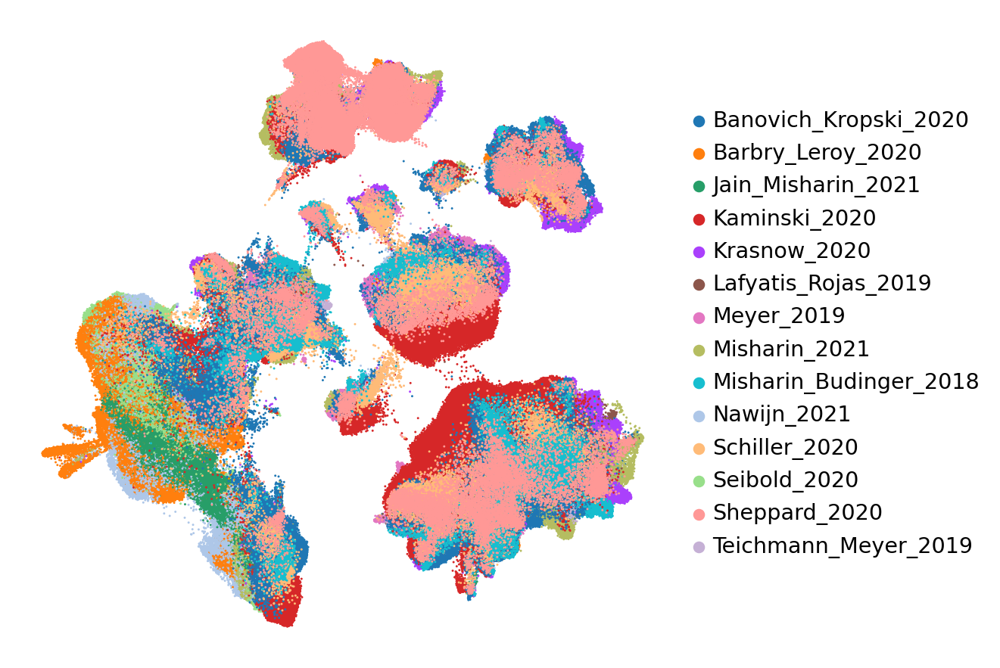

In [49]:
sc.pl.umap(embed_disease, color="study", size=7, frameon=False, wspace=0.6, title="")

Checking by core, extension_healthy, and extension_disease.

In [50]:
%%time
temp = list()
for i in embed_disease.obs.index:
    if embed_disease.obs.loc[i, "condition"] == "IPF":
        temp.append(embed_disease.obs.loc[i, "core_or_extension"] + "_disease")
    elif embed_disease.obs.loc[i, "core_or_extension"] == "extension":
        temp.append(embed_disease.obs.loc[i, "core_or_extension"] + "_healthy")
    else:
        temp.append(embed_disease.obs.loc[i, "core_or_extension"])
embed_disease.obs["reference_condition"] = temp

CPU times: user 27.2 s, sys: 38.9 ms, total: 27.3 s
Wall time: 27.3 s


### Cell types visualization

Shuffle cells, so that they are plotted in random order in the umaps below.

In [51]:
index_list = embed_disease.obs.index.tolist()
np.random.shuffle(index_list)
embed_disease = embed_disease[index_list, :]

Store columns to plot:

In [56]:
cluster_columns = [
    # "celltypes",
    "transf_ann_level_4_label",
    "transf_ann_level_5_label",
]
obs_columns = list(
    set(
        [
            "dataset",
            "reference_condition",
            "condition",
            "core_or_extension",
        ]
    )
    & set(embed_disease.obs.columns)
)

Plot:

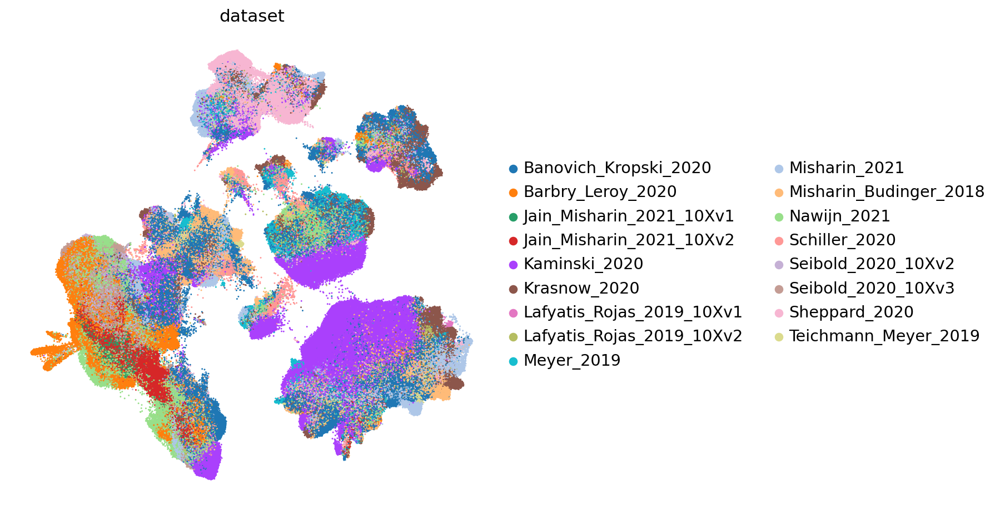

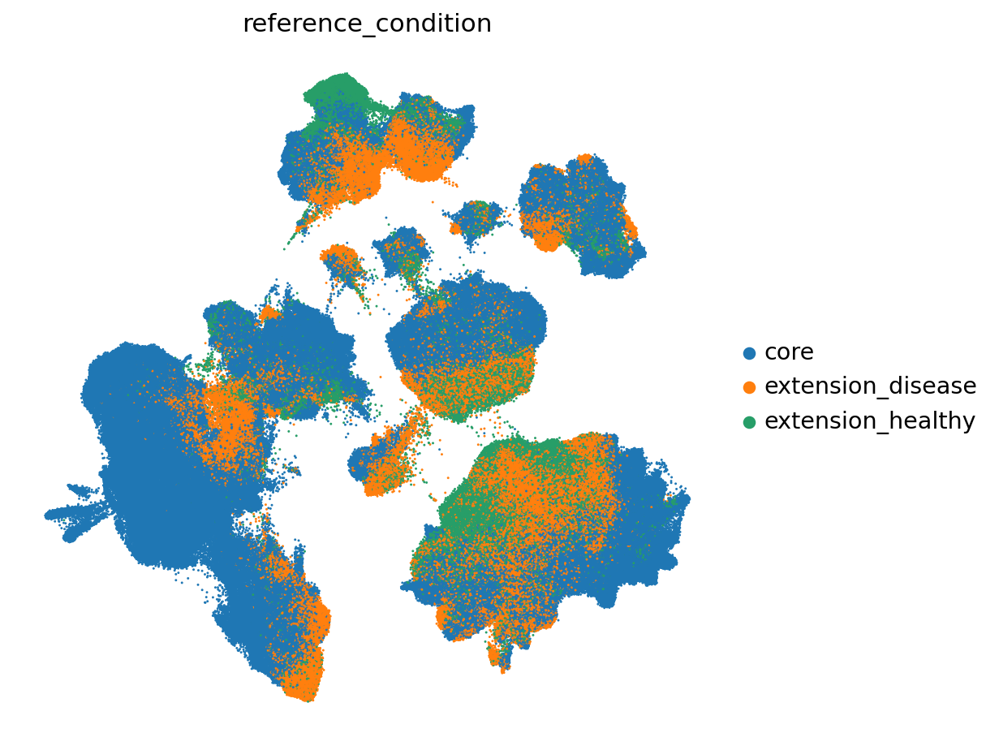

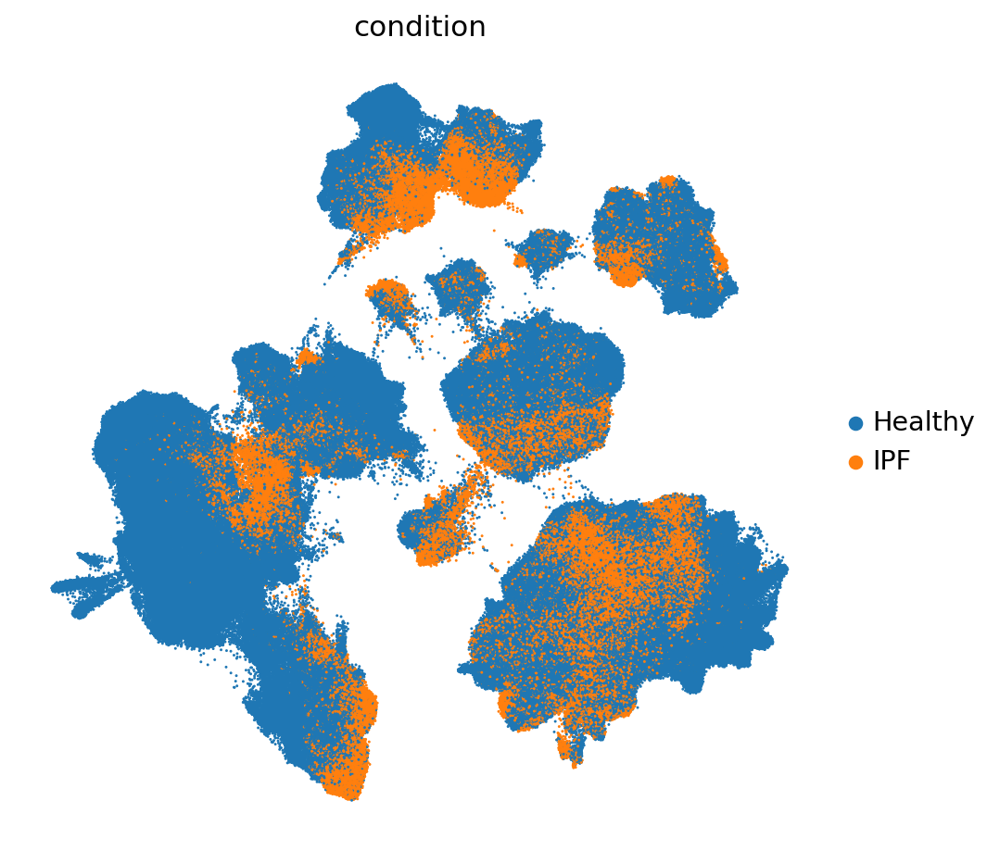

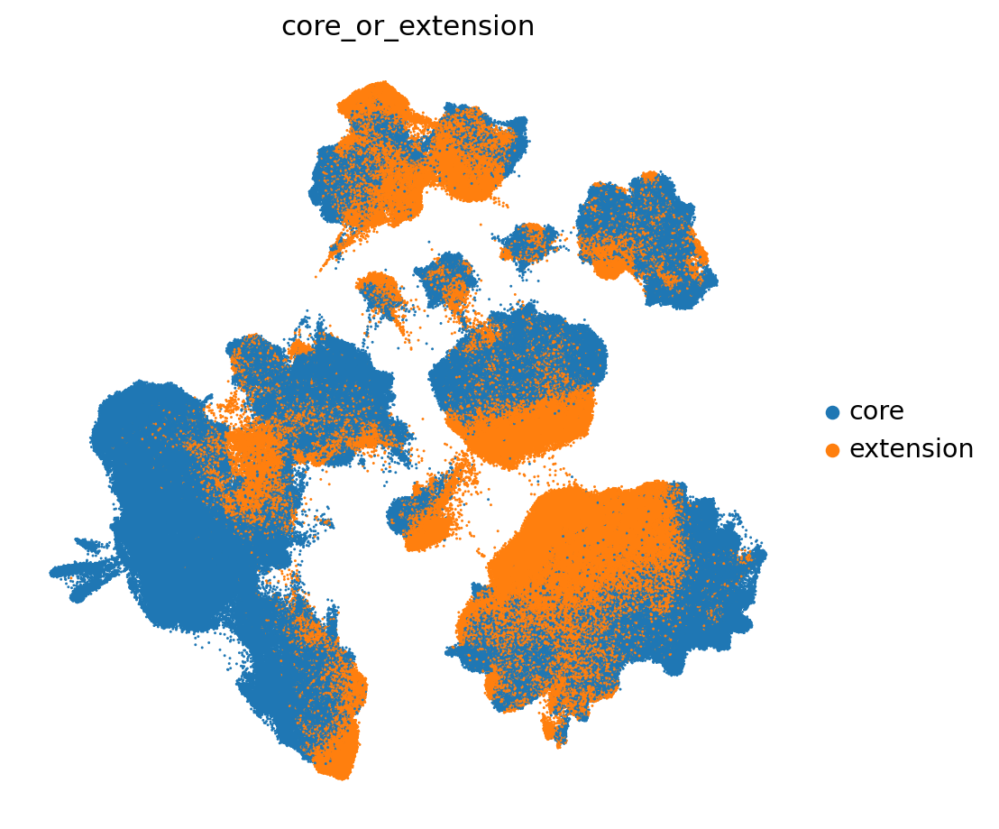

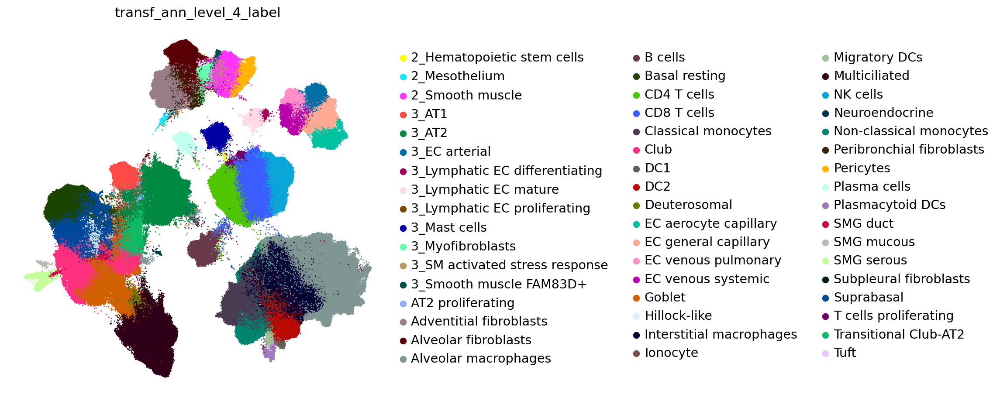

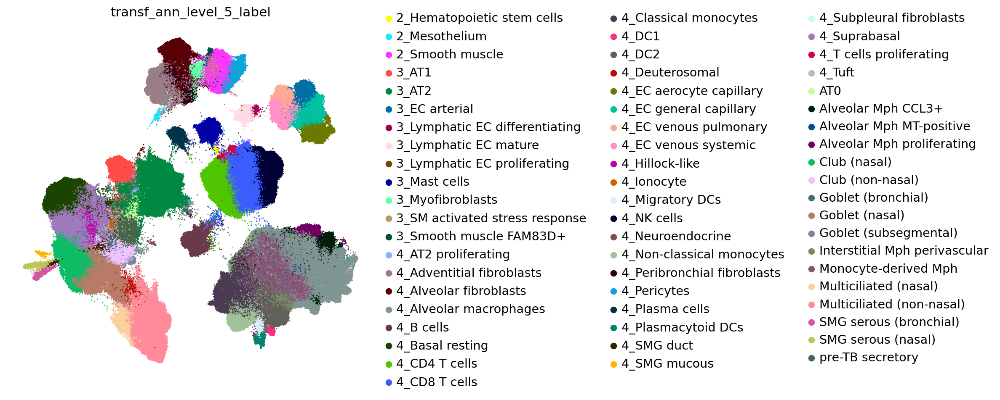

In [57]:
temp = obs_columns + cluster_columns
for i in temp:
    ax = sc.pl.umap(
        embed_disease,
        color=i,
        size=7,
        frameon=False,
        wspace=0.6,
        return_fig=True,
    )

Let's check the label transfer uncertainties in the UMAP.

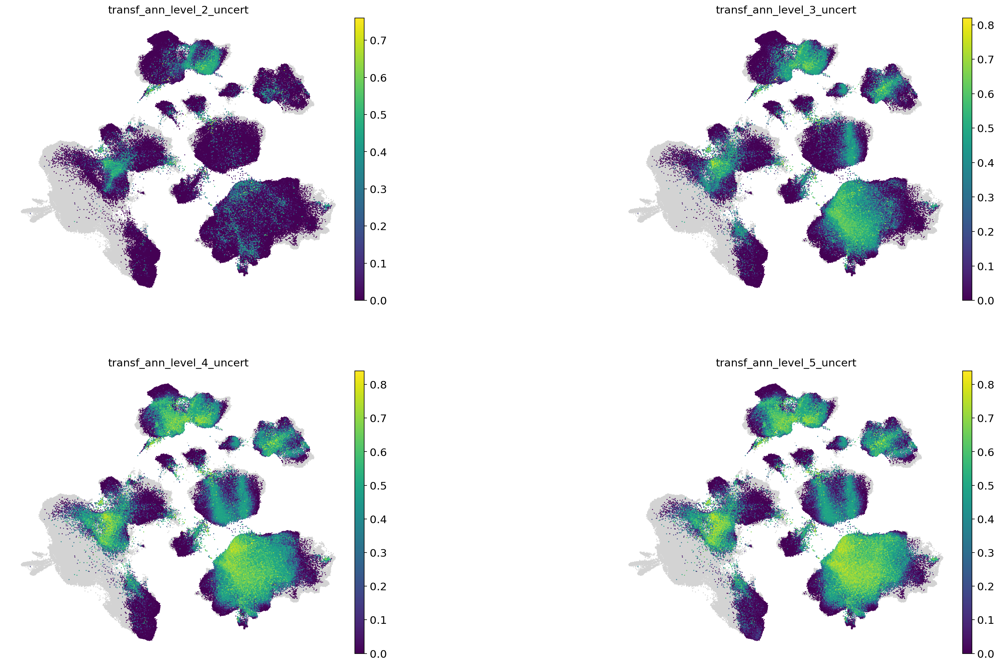

In [58]:
sc.pl.umap(
    adata=embed_disease,
    color=[
        "transf_ann_level_2_uncert",
        "transf_ann_level_3_uncert",
        "transf_ann_level_4_uncert",
        "transf_ann_level_5_uncert",
    ],
    size=7,
    frameon=False,
    wspace=0.6,
    ncols=2,
)

#### Selected annotation level

Set `celltypes` to chosen annotation level (top of notebook), remove `[number]_` prefixes:

In [62]:
embed_disease.obs["celltypes"] = [
    re.sub(".*_", "", i) for i in embed_disease.obs[celltypes_labels + "_label"]
]

Getting IPF datasets

In [63]:
df = pd.crosstab(embed_disease.obs.study, embed_disease.obs.condition)
df
dsets = list(
    set(df.loc[df.IPF > 0].index.tolist()) - set(["Barbry_unpubl", "Schiller_2020"])
)
dsets.append("Schiller_2020")
dsets

['Banovich_Kropski_2020',
 'Kaminski_2020',
 'Misharin_Budinger_2018',
 'Sheppard_2020',
 'Schiller_2020']

Set cell types with fewer than 20 counts in IPF datasets to "other"

In [64]:
embed_disease_e = embed_disease[embed_disease.obs.dataset.isin(dsets)].copy()
ct_counts = embed_disease_e.obs["celltypes"].value_counts()
ct_to_remove = ct_counts[ct_counts < 20].index.tolist()
embed_disease_e.obs["celltypes_clean"] = embed_disease_e.obs["celltypes"].astype(str)
embed_disease_e.obs.loc[
    embed_disease_e.obs["celltypes"].isin(ct_to_remove),
    "celltypes_clean",
] = "Other"

Checking uncertainty values per dataset:

In [66]:
pd.crosstab(embed_disease_e.obs.study, embed_disease_e.obs.condition)
embed_disease_e.obs.groupby(["study", "core_or_extension"])[
    celltypes_labels + "_uncert"
].mean()

study                   core_or_extension
Banovich_Kropski_2020   core                      NaN
                        extension            0.145960
Kaminski_2020           core                      NaN
                        extension            0.203882
Misharin_Budinger_2018  core                      NaN
                        extension            0.144572
Schiller_2020           core                      NaN
                        extension            0.124362
Sheppard_2020           core                      NaN
                        extension            0.181476
Name: transf_ann_level_5_uncert, dtype: float64

Calculate uncertainties for healthy and IPF samples separately:

In [67]:
uncerts_ts_group = (
    embed_disease_e.obs.groupby(["celltypes_clean", "condition"])
    .agg({celltypes_labels + "_uncert": "mean", "condition": "count"})
    .unstack()
).droplevel(axis=1, level=0)
uncerts_ts_group

condition,Healthy,IPF,Healthy,IPF
celltypes_clean,,,,
AT0,0.344987,0.430677,918,925
AT1,0.052865,0.184763,6685,856
AT2,0.028623,0.092439,50842,8942
AT2 proliferating,0.135550,0.250079,787,95
Adventitial fibroblasts,0.146072,0.236039,4167,6002
...,...,...,...,...
Smooth muscle FAM83D+,0.315108,0.361406,65,144
Subpleural fibroblasts,0.358486,0.394345,181,76
Suprabasal,0.301518,0.270360,307,1976


rename columns:

In [68]:
uncerts_ts_group.columns = ["Healthy_unc", "IPF_unc", "Healthy_ncells", "IPF_ncells"]

Calculate the cell type order based on the differences between uncertainty in IPF versus healthy.

In [69]:
diff_uncerts = uncerts_ts_group.IPF_unc - uncerts_ts_group.Healthy_unc
# drop cell types that aren't present in both
diff_uncerts_filt = diff_uncerts.loc[
    [
        (suff_h and suff_i)
        for suff_h, suff_i in zip(
            uncerts_ts_group.Healthy_ncells > 10, uncerts_ts_group.IPF_ncells > 10
        )
    ]
].copy()

In [70]:
order_violin = diff_uncerts_filt.sort_values(ascending=False).index

In [71]:
plt.rcParams["figure.figsize"] = (10, 3)

Now plot cell type uncertainty distributions in IPF versus healthy. Let's check it aggregated across all datasets first.

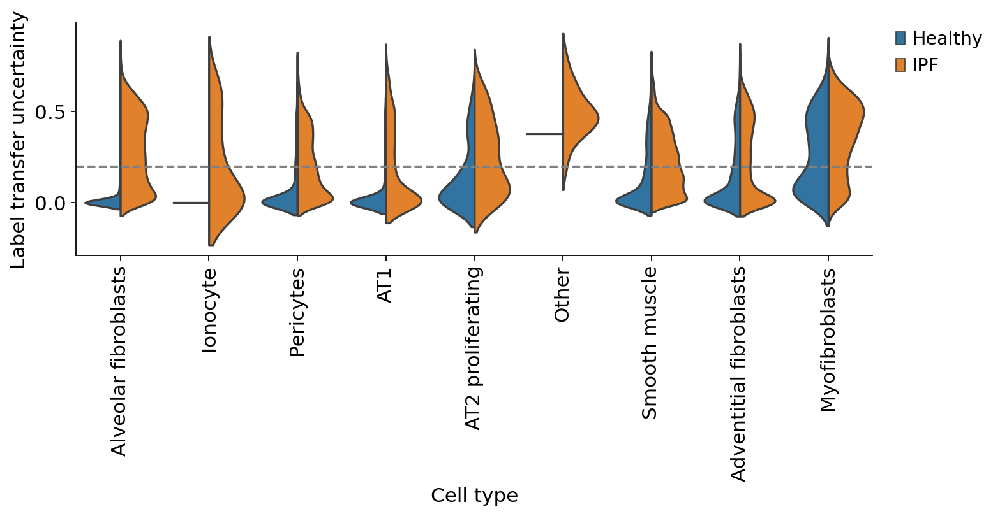

In [80]:
fig, ax = plt.subplots()
sns.violinplot(
    x=embed_disease_e.obs["celltypes_clean"],
    y=embed_disease_e.obs[celltypes_labels + "_uncert"],
    hue=embed_disease_e.obs.condition,
    split=True,
    inner=None,
    order=order_violin[:9],
    scale="width",
    ax=ax,
    palette={"Healthy": "tab:blue", "IPF": "tab:orange"},
)
ax.axhline(
    0.2,
    linestyle="dashed",
    color="grey",
)
ax.set(xlabel="Cell type", ylabel="Label transfer uncertainty")
ax.tick_params("x", rotation=90)
ax.grid(False)
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0, frameon=False)
sns.despine()

Now by dataset (aggregated all cell types).

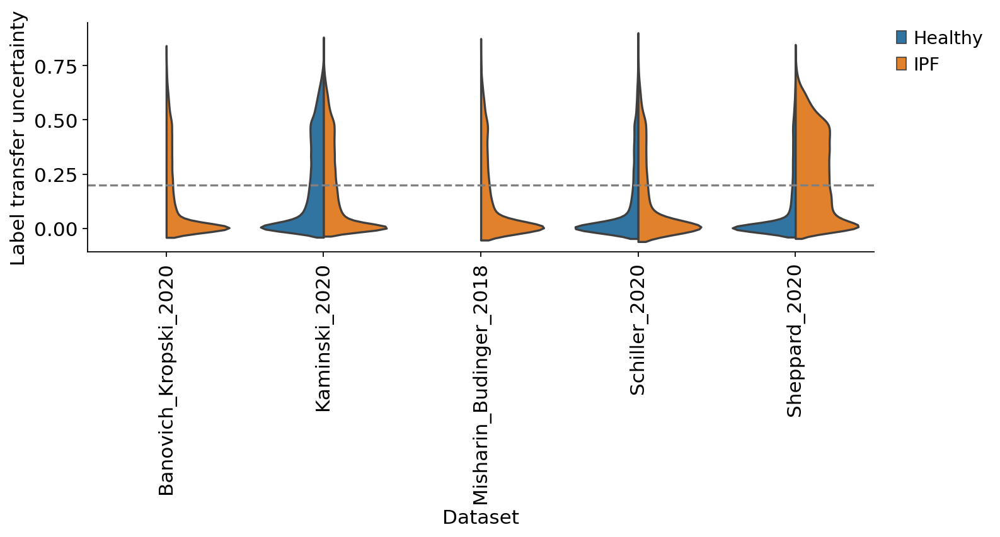

In [79]:
fig, ax = plt.subplots()
sns.violinplot(
    x=embed_disease_e.obs.dataset,
    y=embed_disease_e.obs[celltypes_labels + "_uncert"],
    hue=embed_disease_e.obs.condition,
    split=True,
    inner=None,
    scale="width",
    ax=ax,
    palette={"Healthy": "tab:blue", "IPF": "tab:orange"},
)
ax.axhline(
    0.2,
    linestyle="dashed",
    color="grey",
)
ax.set(xlabel="Dataset", ylabel="Label transfer uncertainty")
ax.tick_params("x", rotation=90)
ax.grid(False)
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0, frameon=False)
sns.despine()

You can see some of the studies don't have uncertainty for the healthy part because that's in the core, which was used for label transfer.

In [81]:
plt.rcParams["figure.figsize"] = (14, 10)

Finally, let's have a look at each cell type separating datasets to evaluate if differences are consistent accross datasets.

EXTENDED DATA FIGURE 10a 

Saving to: ../../results/figures/IPF_cross_dataset_violin_all-celltypes_per-dataset.png


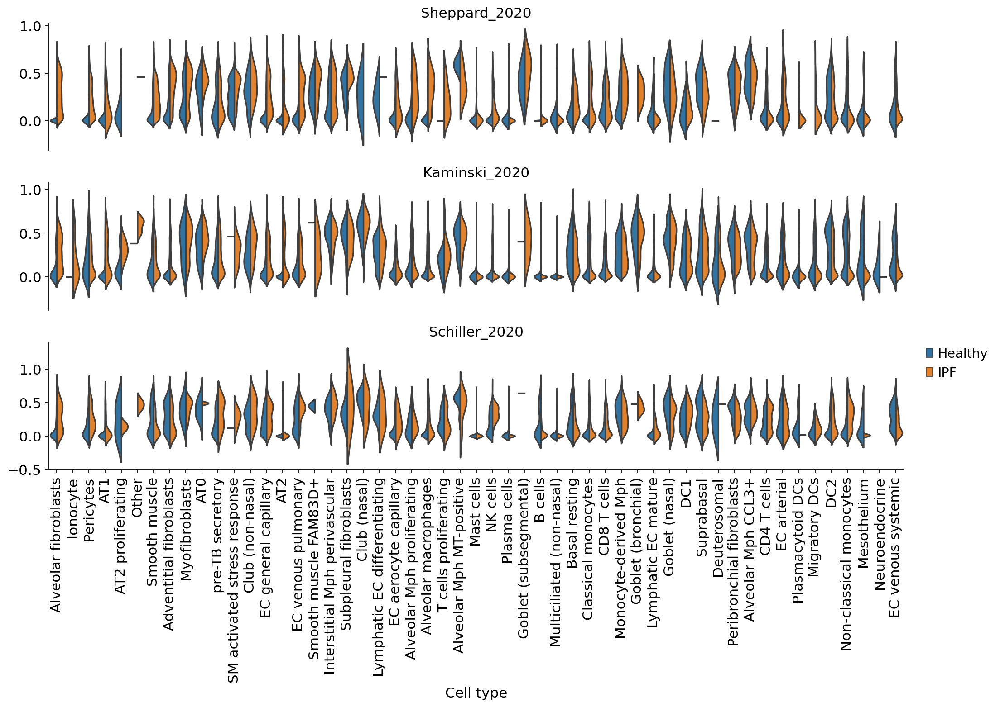

In [82]:
df0 = embed_disease_e.obs.copy()
qc_obs = [
    "Sheppard_2020",
    "Kaminski_2020",
    # 'Misharin_Budinger_2018', # no uncertainty calculation for core
    # 'Banovich_Kropski_2020', # no uncertainty calculation for core
    "Schiller_2020",
]  # df0.dataset.cat.categories
pl_obs = [
    "celltypes_clean",
    celltypes_labels + "_uncert",
    "condition",
]
df0[pl_obs[0]] = df0[pl_obs[0]].astype("category")
df0[pl_obs[2]] = df0[pl_obs[2]].astype("category")
all_refs = list(df0[pl_obs[2]].cat.categories)
all_ctyp = list(df0[pl_obs[0]].cat.categories)
nrows_i = 3
ncols_i = 1
i = 0
fig, axs = plt.subplots(nrows=nrows_i, ncols=ncols_i)
for j in range(nrows_i):
    for k in range(ncols_i):
        if (len(qc_obs) - 1) >= i:
            df = df0.loc[df0.dataset == qc_obs[i], pl_obs]
            df[pl_obs[0]] = df[pl_obs[0]].cat.set_categories(all_ctyp)
            df[pl_obs[2]] = df[pl_obs[2]].cat.set_categories(all_refs)
            sns.violinplot(
                x=df[pl_obs[0]],
                y=df[pl_obs[1]],
                hue=df[pl_obs[2]],
                split=len(df[pl_obs[2]].cat.categories) > 1,
                order=order_violin,
                inner=None,
                scale="width",
                ax=axs[j],
                palette={
                    "Healthy": "tab:blue",
                    "IPF": "tab:orange",
                },
            )
            if j == (nrows_i - 1):
                axs[j].set(xlabel="Cell type")
                axs[j].set(ylabel="Label transfer uncertainty")
                if k == (ncols_i - 1):
                    axs[j].set(ylabel=None)
                    axs[j].legend(
                        bbox_to_anchor=(1.02, 1),
                        loc="upper left",
                        borderaxespad=0,
                        frameon=False,
                    )
                else:
                    axs[j].legend([], [], frameon=False)
                axs[j].tick_params("x", rotation=90)
                axs[j].grid(False)
                sns.despine(ax=axs[j])
            else:
                axs[j].set(xlabel=None, ylabel=None)
                axs[j].tick_params(bottom=False)
                axs[j].grid(False)
                axs[j].legend([], [], frameon=False)
                sns.despine(bottom=True, ax=axs[j])
                axs[j].set(xticklabels=[])
            axs[j].set_title(qc_obs[i])
            i += 1
file_name = (
    str(sc.settings.figdir) + "/IPF_cross_dataset_violin_all-celltypes_per-dataset.png"
)
print(f"Saving to: {file_name}")
plt.tight_layout()
plt.savefig(fname=file_name, bbox_inches="tight", transparent=True)

### Save <a class="anchor" id="bullet6"></a>

In [83]:
embed_disease.write(filename=embed_out)

Done.